<a href="https://colab.research.google.com/github/MSMRo/DSP_ISB/blob/main/YOLOv5_Custom_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tarea YOLO v5

Alumno: Moises Meza Rodriguez

Este notebook describe el proceso llevado a cabo para entrenar un modelo YOLOv5 (You Only Look Once) de manera personalizada. YOLOv5 es un modelo de detección de objetos de última generación que permite reconocer objetos en imágenes. El entrenamiento personalizado permite ajustar el modelo a un conjunto de datos específico, logrando que el modelo sea capaz de detectar objetos únicos presentes en dicho conjunto.



---



# Montamos el drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Instalamos los requerimientos de YOlo V5

In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16977, done.
remote: Counting objects: 100% (172/172), done.
remote: Compressing objects: 100% (119/119), done.
remote: Total 16977 (delta 90), reused 109 (delta 53), pack-reused 16805 (from 1)
Receiving objects: 100% (16977/16977), 15.71 MiB | 6.37 MiB/s, done.
Resolving deltas: 100% (11619/11619), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.4/80.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00
Setup complete. Using torch 2.4.1+cu121 (NVIDIA A100-SXM4-40GB)


# Descargamos el dataset de ROboFLow

https://universe.roboflow.com/roboflow-jvuqo/football-players-detection-3zvbc/dataset/12

In [3]:
!unzip -q /content/drive/MyDrive/1_MIA_UNI/CICLO-II/DL/clase_yolo/dataset_players.zip -d /content/data

# Entrenamos Yolov5

En este paso, el conjunto de datos personalizado se preparó en un formato adecuado para YOLOv5. El formato requerido por YOLOv5 incluye imágenes y archivos de anotación correspondientes, donde cada archivo de anotación es un archivo de texto que describe los objetos presentes en la imagen.



In [5]:
!python train.py --img 1280 --batch 4 --epochs 5 --data /content/data/data.yaml --weights yolov5x.pt --cache

2024-10-11 04:10:27.718929: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-11 04:10:27.741307: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-11 04:10:27.747942: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=, data=/content/data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=4, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 416 --conf 0.1 --source /content/data/test/images

detect: weights=['runs/train/exp3/weights/best.pt'], source=/content/data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-371-g6629839d Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 322 layers, 86193601 parameters, 0 gradients, 203.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/25 /content/data/test/images/08fd33_3_6_png.rf.bee65249830b3e263ebe95a999f39e34.jpg: 416x416 38 players, 12.7ms
image 2/25 /content/data/test/images/08fd33_9_3_png.rf.f5439a0d252bbf8a8ce96169744b49b6.jpg: 416x416 35 players, 13.0ms
image 3/25 

# Usamos el modelo generado entrenado

Tras el entrenamiento, se evaluó el rendimiento del modelo utilizando el conjunto de prueba. Las métricas clave, como la precisión, el recall y el mAP, se calcularon para cuantificar la precisión del modelo en la detección de objetos.
Para usar el modelo debemos que usar los pesos obtenidos de la ruta:

'runs/train/exp2/weights/best.pt'

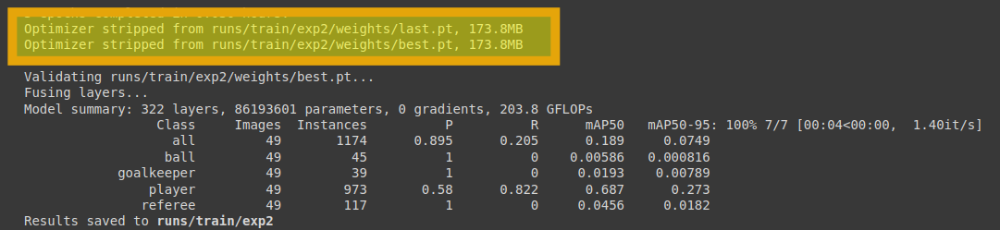


In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('runs/train/exp3/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
import cv2
import torch
from PIL import Image

# Model
#model = torch.hub.load("ultralytics/yolov5",
                       #model='yolov5s',
                       #weights="/content/model/best.pt",
#                       path="/content/model/best.pt",
                       #pretrained=True
#                       )  # default
model = torch.hub.load('ultralytics/yolov5', 'custom', 'runs/train/exp2/weights/best.pt')
# Images
#for f in ("messi.jpg","ronaldo.jpeg"):
#    torch.hub.download_url_to_file("/home/stevend/Documents/maestria_UNI/DL/clase_yolo/" + f, f)  # download 2 images
im1 = Image.open("/content/2e57b9_1_1_png.rf.737d1cf951f39068509d8095e4951f0b.jpg")  # PIL image
#im2 = cv2.imread("/home/stevend/Documents/maestria_UNI/DL/clase_yolo/ronaldo.jpeg")[..., ::-1]  # OpenCV image (BGR to RGB)

# Inference
results = model(im1)  # batch of images

# Results
results.print()
results.save()  # or .show()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-10-11 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
Model summary: 322 layers, 86193601 parameters, 0 gradients, 203.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 1280x1280 35 players
Speed: 14.8ms pre-process, 56.3ms inference, 523.0ms NMS per image at shape (1, 3, 640, 640)
Saved 1 image to runs/detect/exp3


In [16]:
import pandas as pd

results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,845.520264,311.199799,859.047974,384.251068,0.583960,2,player
1,853.750122,356.756622,867.487305,427.315277,0.542540,2,player
2,912.002747,524.590393,927.599670,650.888733,0.538452,2,player
3,432.316223,428.126312,441.612061,514.718994,0.527995,2,player
4,152.425293,372.347778,169.575897,440.243652,0.517414,2,player
5,710.339355,277.647278,726.471191,334.416382,0.512691,2,player
6,930.589966,412.303772,947.899414,489.790161,0.512320,2,player
7,903.908691,542.410339,932.721313,628.481506,0.493611,2,player
8,1059.481201,281.472351,1077.835693,352.794312,0.492855,2,player
9,155.325272,353.912842,165.148422,458.801147,0.491979,2,player


## Probamos con una imagen nueva

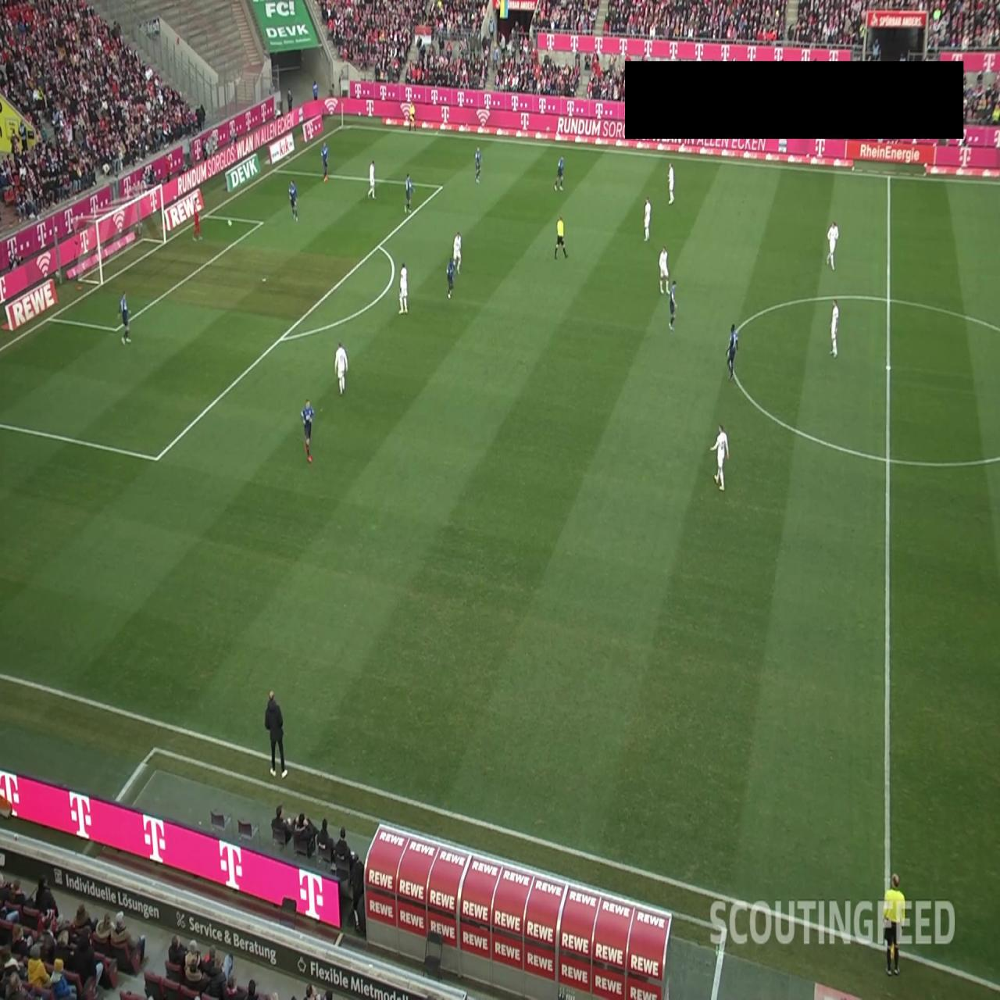

In [19]:
display(Image.open('/content/2e57b9_1_1_png.rf.737d1cf951f39068509d8095e4951f0b.jpg')) # Call Image.open to open the file


El resultado se coloca aqui:
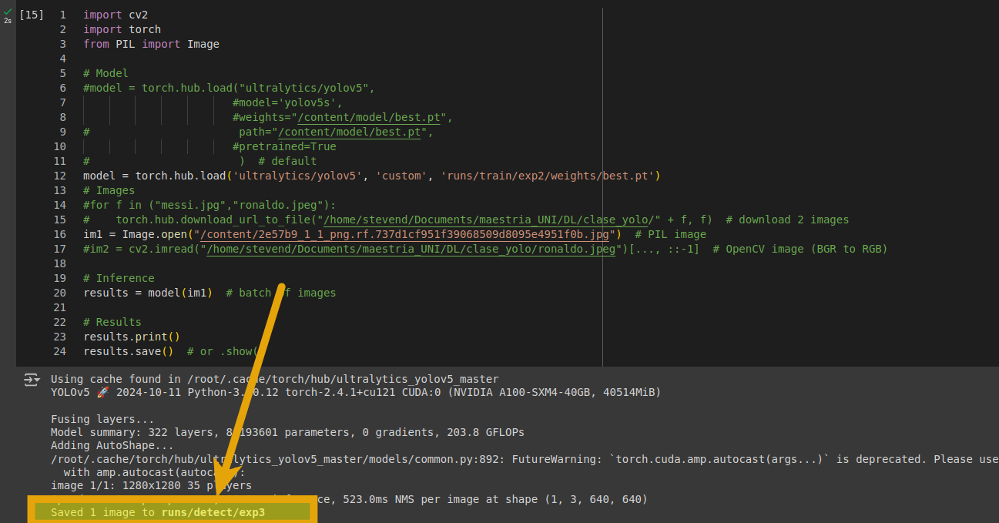

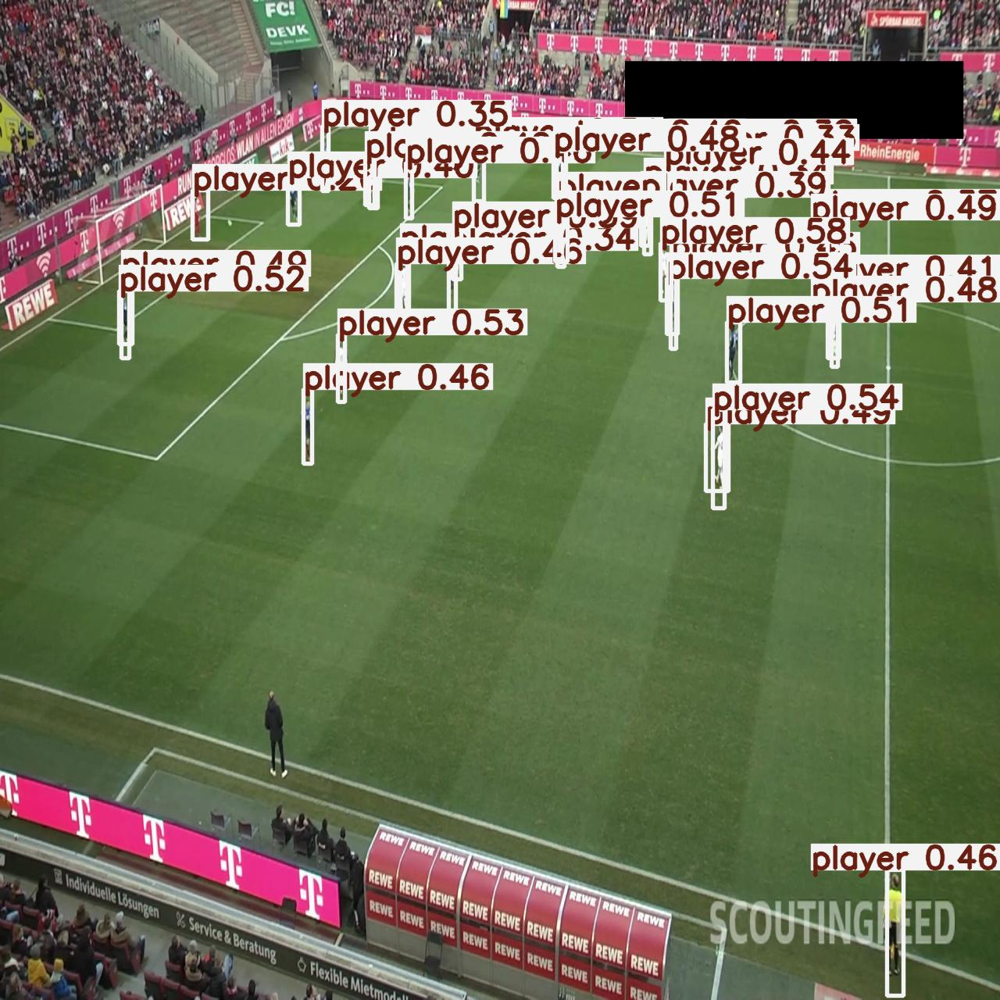

In [23]:
# debemos de llamar a esa imagen con el object detection
display(Image.open('/content/yolov5/runs/detect/exp3/2e57b9_1_1_png.rf.737d1cf951f39068509d8095e4951f0b.jpg')) # Call Image.open to open the file
